# Computer Vision Assignment 04
### Name: Ahad Anwar
### Reg: SP20-BCS-054

---


# VGG19
## Applying VGG19 for Transfer Learning

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split

In [3]:
base_path = '/content/drive/MyDrive/dataset/images'
pizza_folder = os.path.join(base_path, 'pizza')
burger_folder = os.path.join(base_path, 'burger')
icecream_folder = os.path.join(base_path, 'icecream')

In [4]:
image_size = (224, 224)
batch_size = 32

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # 80% training, 20% validation split
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [16]:
train_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

Found 243 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [6]:
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

80134624/80134624 [==============================] - 3s 0us/step


In [7]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

In [9]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_generator, validation_data=validation_generator, epochs=30)

Epoch 1/30
8/8 [==============================] - 17s 2s/step - loss: 0.3609 - accuracy: 0.8642 - val_loss: 0.4569 - val_accuracy: 0.8167
Epoch 2/30
8/8 [==============================] - 15s 2s/step - loss: 0.3345 - accuracy: 0.8765 - val_loss: 0.3473 - val_accuracy: 0.8667
Epoch 3/30
8/8 [==============================] - 14s 2s/step - loss: 0.3039 - accuracy: 0.8765 - val_loss: 0.4192 - val_accuracy: 0.8500
Epoch 4/30
8/8 [==============================] - 15s 2s/step - loss: 0.2854 - accuracy: 0.9095 - val_loss: 0.3975 - val_accuracy: 0.8667
Epoch 5/30
8/8 [==============================] - 15s 2s/step - loss: 0.2598 - accuracy: 0.9259 - val_loss: 0.3352 - val_accuracy: 0.9000
Epoch 6/30
8/8 [==============================] - 15s 2s/step - loss: 0.2311 - accuracy: 0.9383 - val_loss: 0.3102 - val_accuracy: 0.9333
Epoch 7/30
8/8 [==============================] - 15s 2s/step - loss: 0.2202 - accuracy: 0.9383 - val_loss: 0.3131 - val_accuracy: 0.8833
Epoch 8/30
8/8 [==================

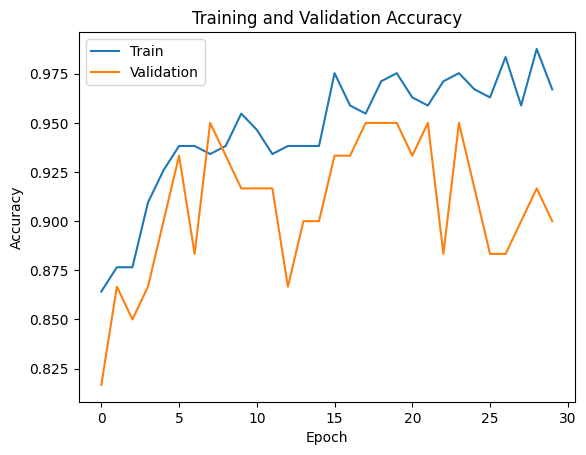

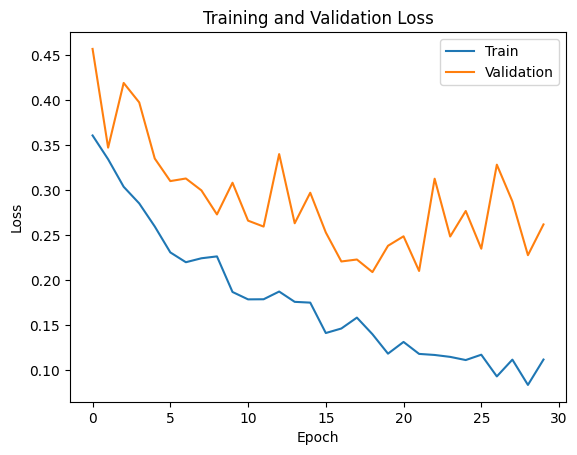

1/1 [==============================] - 0s 212ms/step


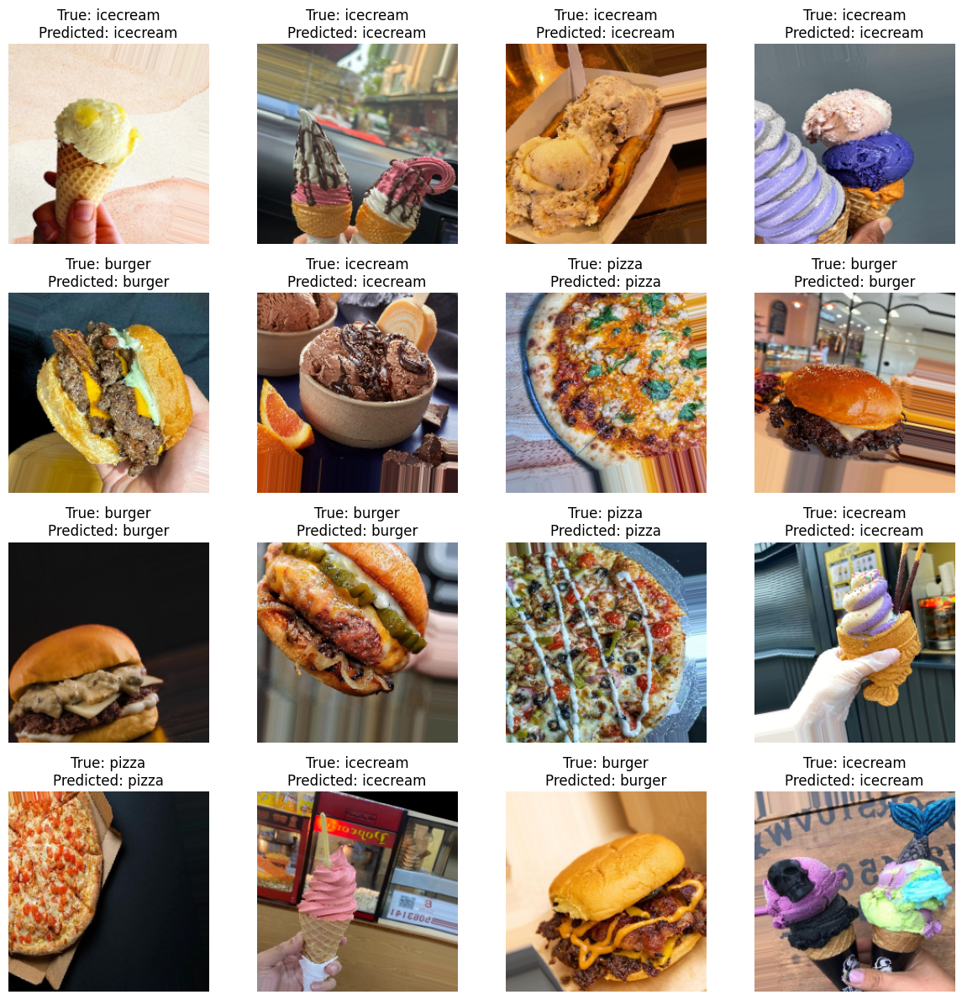

In [10]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Plot training and validation loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

# Generate sample predictions
sample_images, sample_labels = next(validation_generator)
sample_predictions = model.predict(sample_images)

# Convert one-hot encoded labels back to class names
class_names = list(train_generator.class_indices.keys())
sample_labels = np.argmax(sample_labels, axis=1)
sample_predictions = np.argmax(sample_predictions, axis=1)

# Display sample images with their true and predicted labels
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(sample_images[i])
    ax.set_title(f'True: {class_names[sample_labels[i]]}\nPredicted: {class_names[sample_predictions[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

---




# Inception V3
## Applying Inception V3 for Transfer Learning

In [25]:
from tensorflow.keras.applications import InceptionV3

In [26]:
train_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 243 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [27]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 0s 0us/step


In [28]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

In [29]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_generator, validation_data=validation_generator, epochs=30)

Epoch 1/30
8/8 [==============================] - 26s 3s/step - loss: 1.5165 - accuracy: 0.6502 - val_loss: 0.4087 - val_accuracy: 0.8667
Epoch 2/30
8/8 [==============================] - 15s 2s/step - loss: 0.2634 - accuracy: 0.9218 - val_loss: 0.1328 - val_accuracy: 0.9333
Epoch 3/30
8/8 [==============================] - 15s 2s/step - loss: 0.1086 - accuracy: 0.9712 - val_loss: 0.1321 - val_accuracy: 0.9500
Epoch 4/30
8/8 [==============================] - 15s 2s/step - loss: 0.0584 - accuracy: 0.9835 - val_loss: 0.1278 - val_accuracy: 0.9333
Epoch 5/30
8/8 [==============================] - 16s 2s/step - loss: 0.0758 - accuracy: 0.9712 - val_loss: 0.1229 - val_accuracy: 0.9500
Epoch 6/30
8/8 [==============================] - 17s 2s/step - loss: 0.0561 - accuracy: 0.9753 - val_loss: 0.0742 - val_accuracy: 0.9667
Epoch 7/30
8/8 [==============================] - 15s 2s/step - loss: 0.0377 - accuracy: 0.9794 - val_loss: 0.1600 - val_accuracy: 0.9667
Epoch 8/30
8/8 [==================

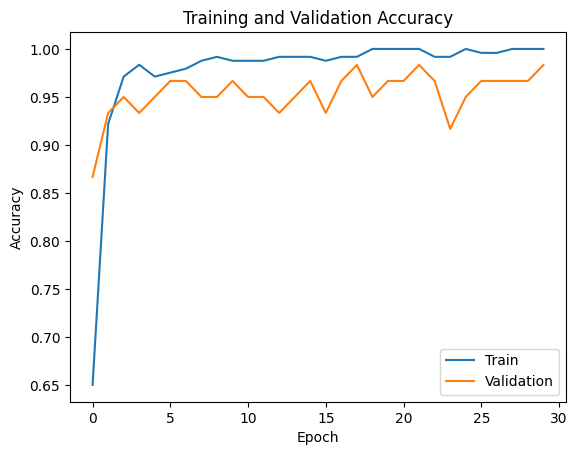

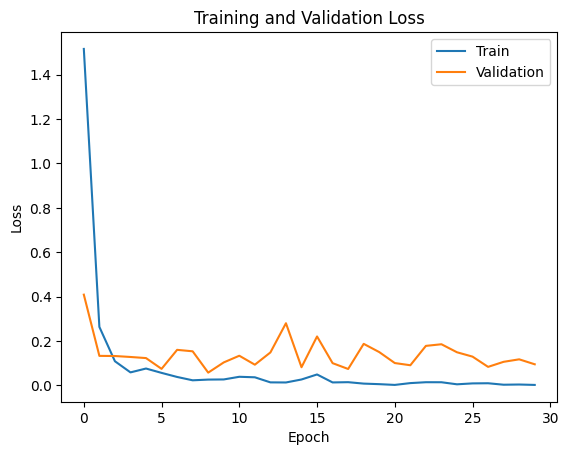

1/1 [==============================] - 1s 1s/step


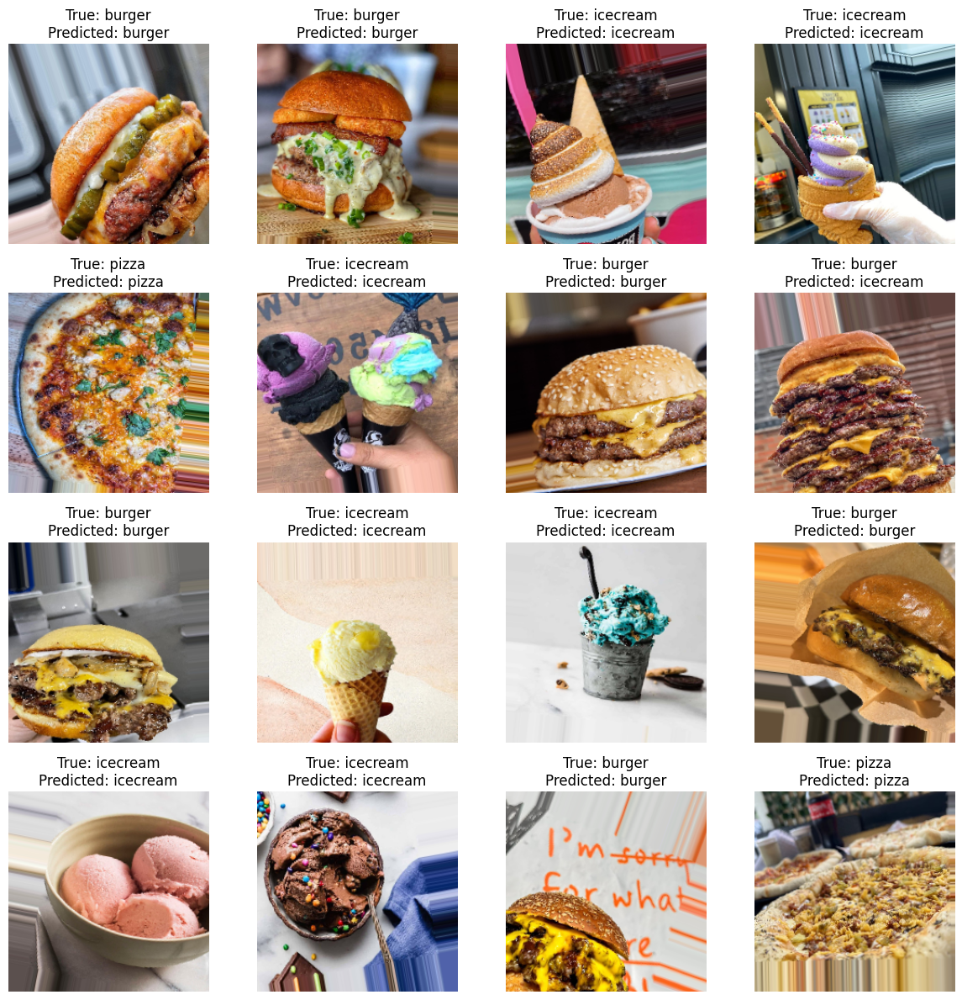

In [30]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Plot training and validation loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

# Generate sample predictions
sample_images, sample_labels = next(validation_generator)
sample_predictions = model.predict(sample_images)

# Convert one-hot encoded labels back to class names
class_names = list(train_generator.class_indices.keys())
sample_labels = np.argmax(sample_labels, axis=1)
sample_predictions = np.argmax(sample_predictions, axis=1)

# Display sample images with their true and predicted labels
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(sample_images[i])
    ax.set_title(f'True: {class_names[sample_labels[i]]}\nPredicted: {class_names[sample_predictions[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

---




# Resnet50
## Applying Resnet50 for Transfer Learning

In [26]:
from tensorflow.keras.applications import ResNet50

In [27]:
train_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 243 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [28]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

94765736/94765736 [==============================] - 1s 0us/step


In [29]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

In [30]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_generator, validation_data=validation_generator, epochs=30)

Epoch 1/30
8/8 [==============================] - 21s 2s/step - loss: 1.3508 - accuracy: 0.3580 - val_loss: 1.1428 - val_accuracy: 0.3667
Epoch 2/30
8/8 [==============================] - 14s 2s/step - loss: 1.1880 - accuracy: 0.3663 - val_loss: 1.1953 - val_accuracy: 0.4333
Epoch 3/30
8/8 [==============================] - 14s 2s/step - loss: 1.1340 - accuracy: 0.4321 - val_loss: 0.9911 - val_accuracy: 0.5667
Epoch 4/30
8/8 [==============================] - 14s 2s/step - loss: 1.0028 - accuracy: 0.5144 - val_loss: 0.9482 - val_accuracy: 0.5500
Epoch 5/30
8/8 [==============================] - 14s 2s/step - loss: 0.9743 - accuracy: 0.5144 - val_loss: 0.9436 - val_accuracy: 0.6000
Epoch 6/30
8/8 [==============================] - 14s 2s/step - loss: 0.9490 - accuracy: 0.4774 - val_loss: 0.9198 - val_accuracy: 0.5333
Epoch 7/30
8/8 [==============================] - 14s 2s/step - loss: 0.9689 - accuracy: 0.5062 - val_loss: 0.9455 - val_accuracy: 0.4333
Epoch 8/30
8/8 [==================

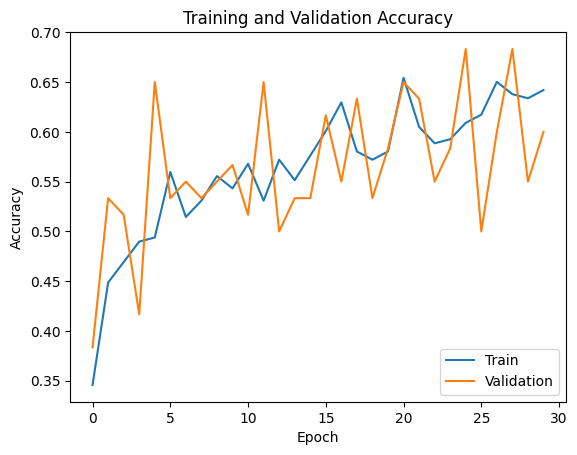

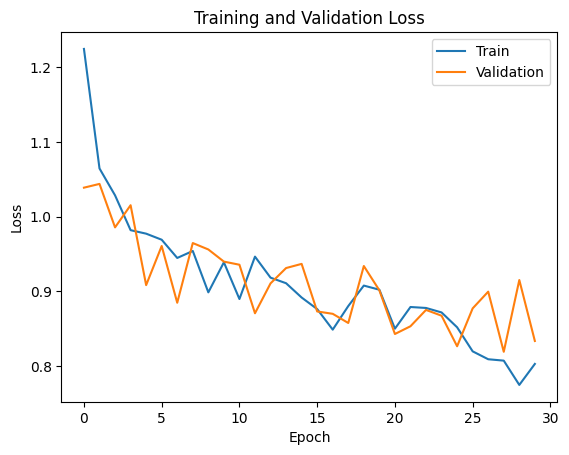

1/1 [==============================] - 9s 9s/step


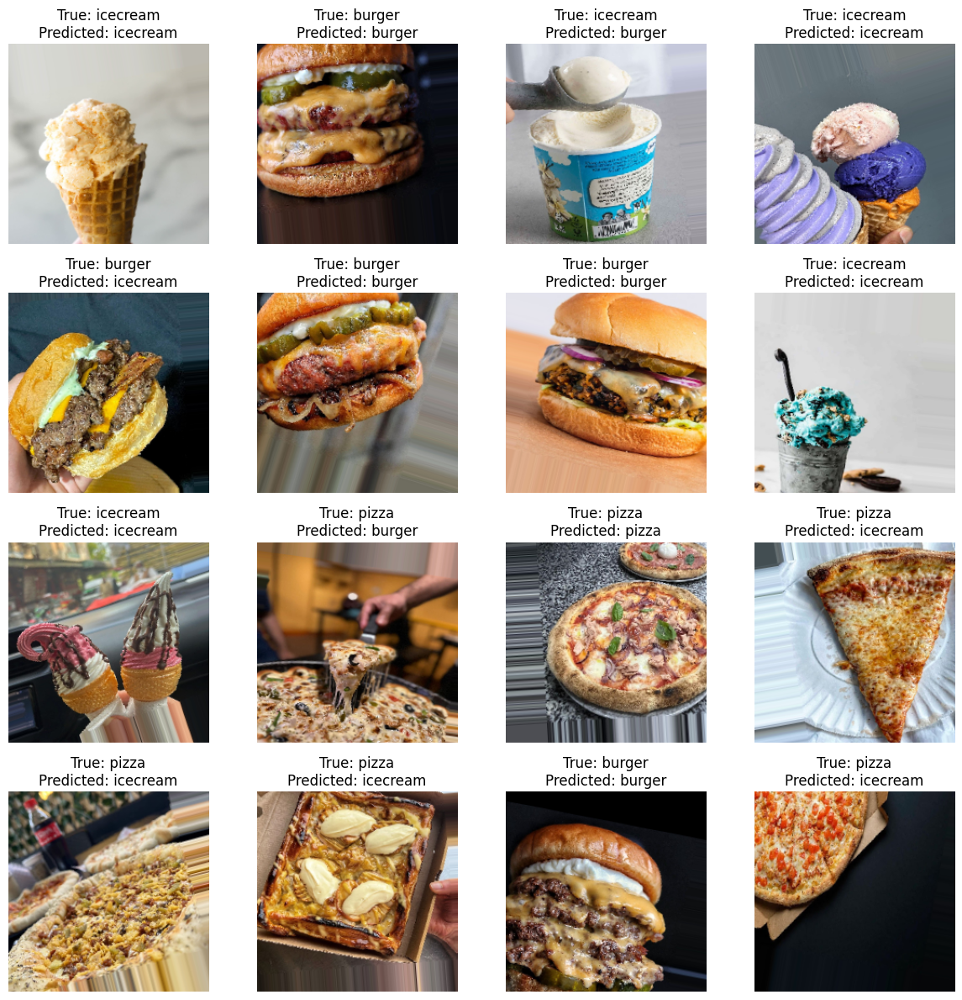

In [37]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Plot training and validation loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

# Generate sample predictions
sample_images, sample_labels = next(validation_generator)
sample_predictions = model.predict(sample_images)

# Convert one-hot encoded labels back to class names
class_names = list(train_generator.class_indices.keys())
sample_labels = np.argmax(sample_labels, axis=1)
sample_predictions = np.argmax(sample_predictions, axis=1)

# Display sample images with their true and predicted labels
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(sample_images[i])
    ax.set_title(f'True: {class_names[sample_labels[i]]}\nPredicted: {class_names[sample_predictions[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

---




# DenseNET
## Applying DenseNET for Transfer Learning

In [5]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

In [6]:
train_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 243 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [7]:
base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

29084464/29084464 [==============================] - 0s 0us/step


In [8]:
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [9]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_generator, validation_data=validation_generator, epochs=30)

Epoch 1/30
8/8 [==============================] - 80s 9s/step - loss: 0.8306 - accuracy: 0.6872 - val_loss: 0.3507 - val_accuracy: 0.8833
Epoch 2/30
8/8 [==============================] - 14s 2s/step - loss: 0.1551 - accuracy: 0.9588 - val_loss: 0.2572 - val_accuracy: 0.9000
Epoch 3/30
8/8 [==============================] - 14s 2s/step - loss: 0.0683 - accuracy: 0.9753 - val_loss: 0.0996 - val_accuracy: 0.9667
Epoch 4/30
8/8 [==============================] - 14s 2s/step - loss: 0.0486 - accuracy: 0.9794 - val_loss: 0.1886 - val_accuracy: 0.9333
Epoch 5/30
8/8 [==============================] - 14s 2s/step - loss: 0.0194 - accuracy: 1.0000 - val_loss: 0.1176 - val_accuracy: 0.9500
Epoch 6/30
8/8 [==============================] - 14s 2s/step - loss: 0.0169 - accuracy: 0.9959 - val_loss: 0.0981 - val_accuracy: 0.9667
Epoch 7/30
8/8 [==============================] - 14s 2s/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 0.0711 - val_accuracy: 0.9500
Epoch 8/30
8/8 [==================

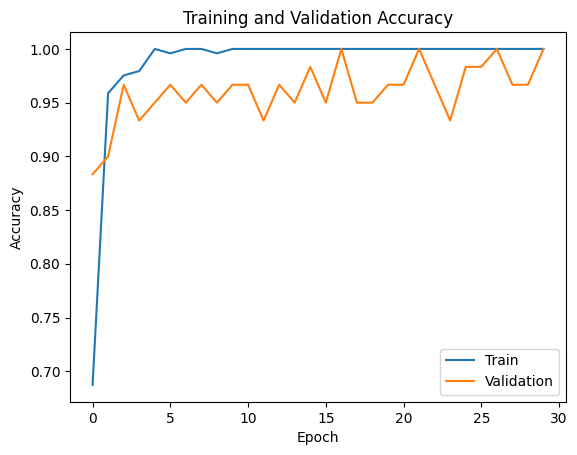

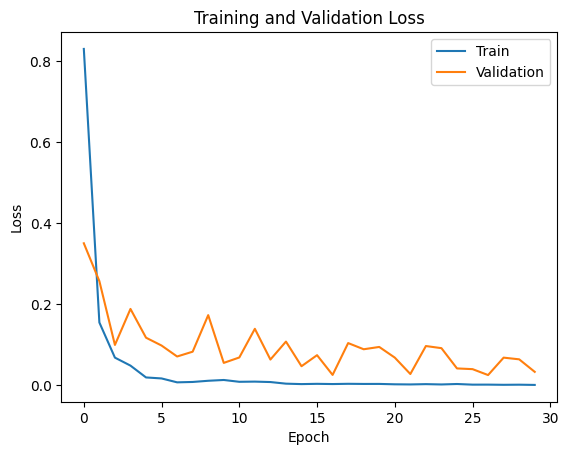

1/1 [==============================] - 2s 2s/step


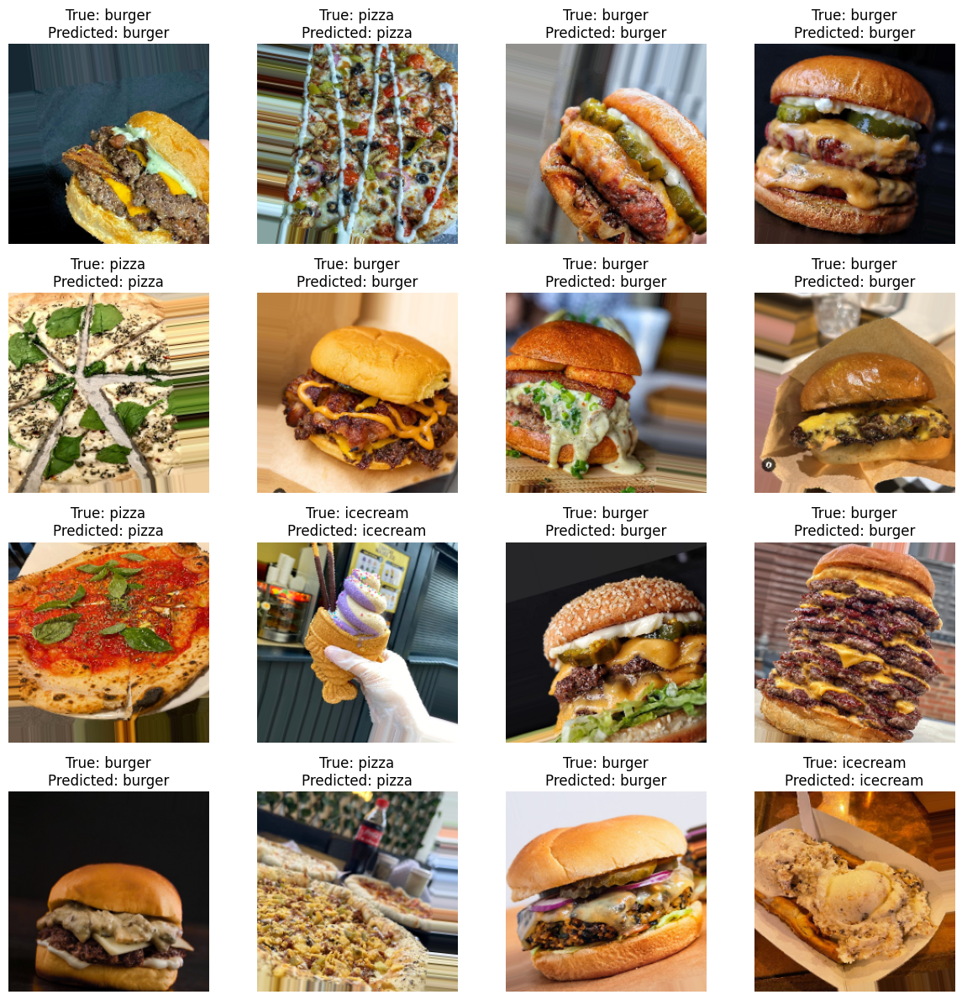

In [10]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Plot training and validation loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

# Generate sample predictions
sample_images, sample_labels = next(validation_generator)
sample_predictions = model.predict(sample_images)

# Convert one-hot encoded labels back to class names
class_names = list(train_generator.class_indices.keys())
sample_labels = np.argmax(sample_labels, axis=1)
sample_predictions = np.argmax(sample_predictions, axis=1)

# Display sample images with their true and predicted labels
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(sample_images[i])
    ax.set_title(f'True: {class_names[sample_labels[i]]}\nPredicted: {class_names[sample_predictions[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

---




# MobileNetV2
## Applying MobileNetV2 for Transfer Learning

In [11]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

In [12]:
train_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 243 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [13]:
base_model = MobileNetV2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


In [14]:
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [16]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_generator, validation_data=validation_generator, epochs=30)

Epoch 1/30
8/8 [==============================] - 20s 2s/step - loss: 0.6556 - accuracy: 0.7737 - val_loss: 0.1670 - val_accuracy: 0.9000
Epoch 2/30
8/8 [==============================] - 14s 2s/step - loss: 0.0482 - accuracy: 0.9877 - val_loss: 0.0697 - val_accuracy: 0.9833
Epoch 3/30
8/8 [==============================] - 14s 2s/step - loss: 0.0380 - accuracy: 0.9835 - val_loss: 0.2025 - val_accuracy: 0.9333
Epoch 4/30
8/8 [==============================] - 14s 2s/step - loss: 0.0285 - accuracy: 0.9877 - val_loss: 0.1394 - val_accuracy: 0.9333
Epoch 5/30
8/8 [==============================] - 14s 2s/step - loss: 0.0071 - accuracy: 1.0000 - val_loss: 0.0526 - val_accuracy: 0.9667
Epoch 6/30
8/8 [==============================] - 14s 2s/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 0.0308 - val_accuracy: 1.0000
Epoch 7/30
8/8 [==============================] - 15s 2s/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 0.0642 - val_accuracy: 0.9833
Epoch 8/30
8/8 [==================

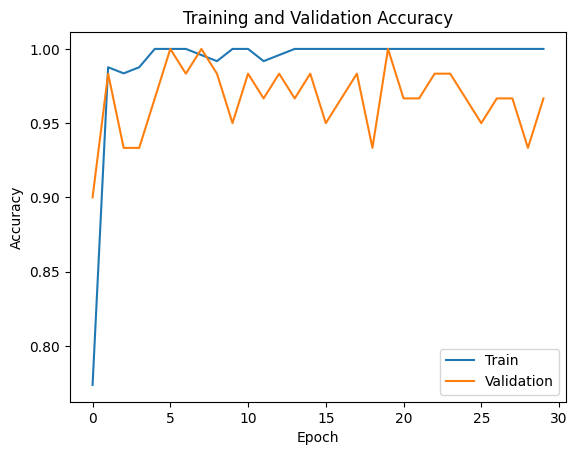

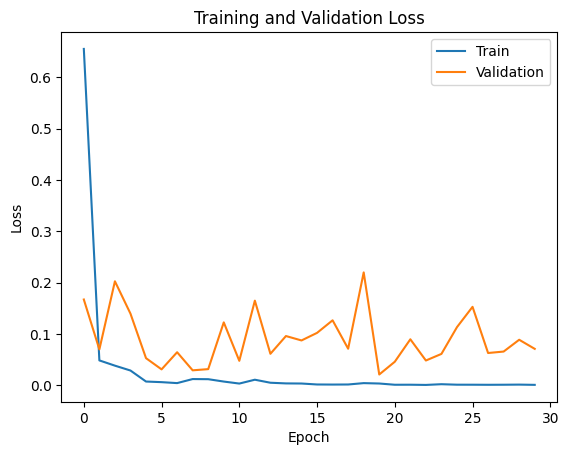

1/1 [==============================] - 1s 760ms/step


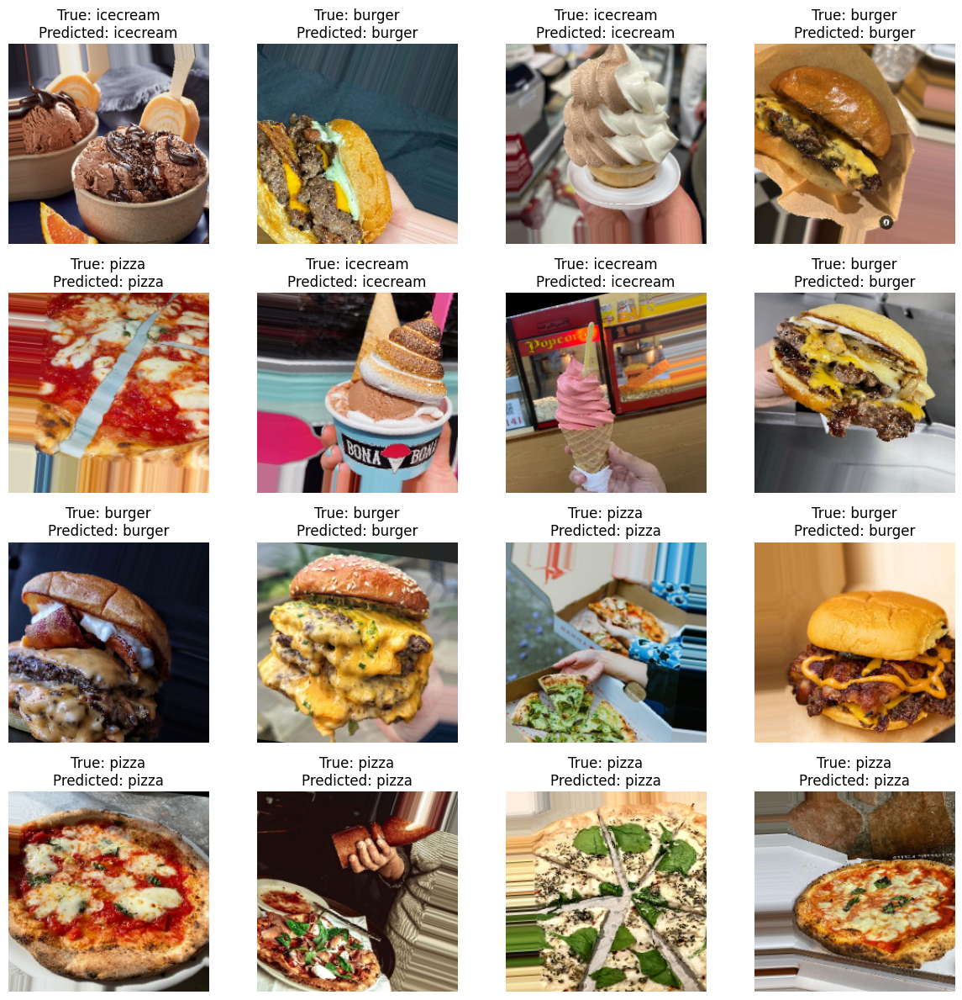

In [17]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Plot training and validation loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

# Generate sample predictions
sample_images, sample_labels = next(validation_generator)
sample_predictions = model.predict(sample_images)

# Convert one-hot encoded labels back to class names
class_names = list(train_generator.class_indices.keys())
sample_labels = np.argmax(sample_labels, axis=1)
sample_predictions = np.argmax(sample_predictions, axis=1)

# Display sample images with their true and predicted labels
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(sample_images[i])
    ax.set_title(f'True: {class_names[sample_labels[i]]}\nPredicted: {class_names[sample_predictions[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

---




# EfficientNet
## Applying EfficientNet for Transfer Learning

In [18]:
!pip install efficientnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.4 MB/s eta 0:00:00


In [19]:
from efficientnet.tfkeras import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

In [20]:
train_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = datagen.flow_from_directory(
    base_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 243 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [21]:
base_model = EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

16804768/16804768 [==============================] - 0s 0us/step


In [22]:
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [23]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_generator, validation_data=validation_generator, epochs=30)

Epoch 1/30
8/8 [==============================] - 27s 2s/step - loss: 0.4566 - accuracy: 0.8354 - val_loss: 0.1288 - val_accuracy: 0.9500
Epoch 2/30
8/8 [==============================] - 14s 2s/step - loss: 0.0836 - accuracy: 0.9547 - val_loss: 0.0633 - val_accuracy: 0.9833
Epoch 3/30
8/8 [==============================] - 16s 2s/step - loss: 0.0288 - accuracy: 0.9918 - val_loss: 0.0703 - val_accuracy: 0.9667
Epoch 4/30
8/8 [==============================] - 14s 2s/step - loss: 0.0170 - accuracy: 0.9959 - val_loss: 0.1053 - val_accuracy: 0.9833
Epoch 5/30
8/8 [==============================] - 14s 2s/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.0760 - val_accuracy: 0.9667
Epoch 6/30
8/8 [==============================] - 14s 2s/step - loss: 0.0178 - accuracy: 0.9959 - val_loss: 0.0580 - val_accuracy: 0.9833
Epoch 7/30
8/8 [==============================] - 14s 2s/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.0364 - val_accuracy: 1.0000
Epoch 8/30
8/8 [==================

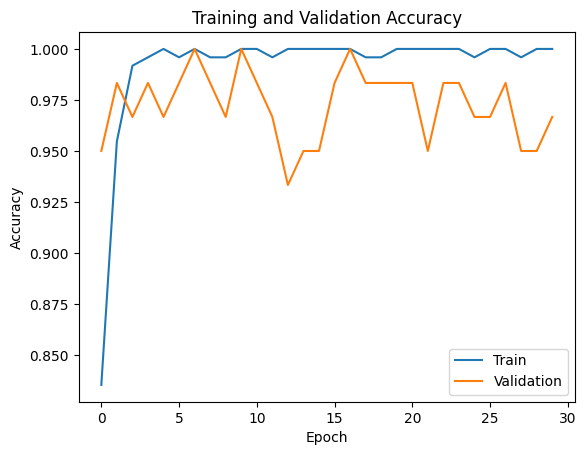

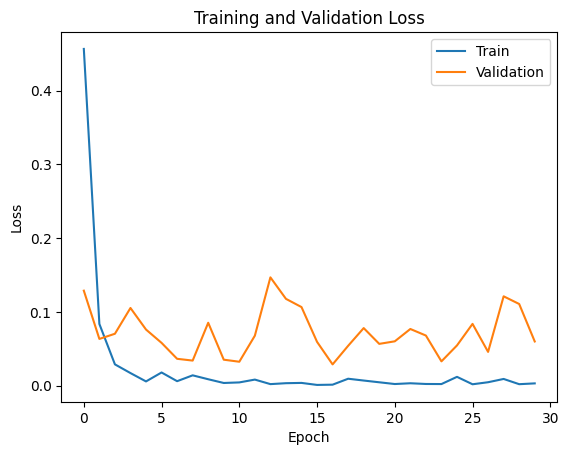

1/1 [==============================] - 2s 2s/step


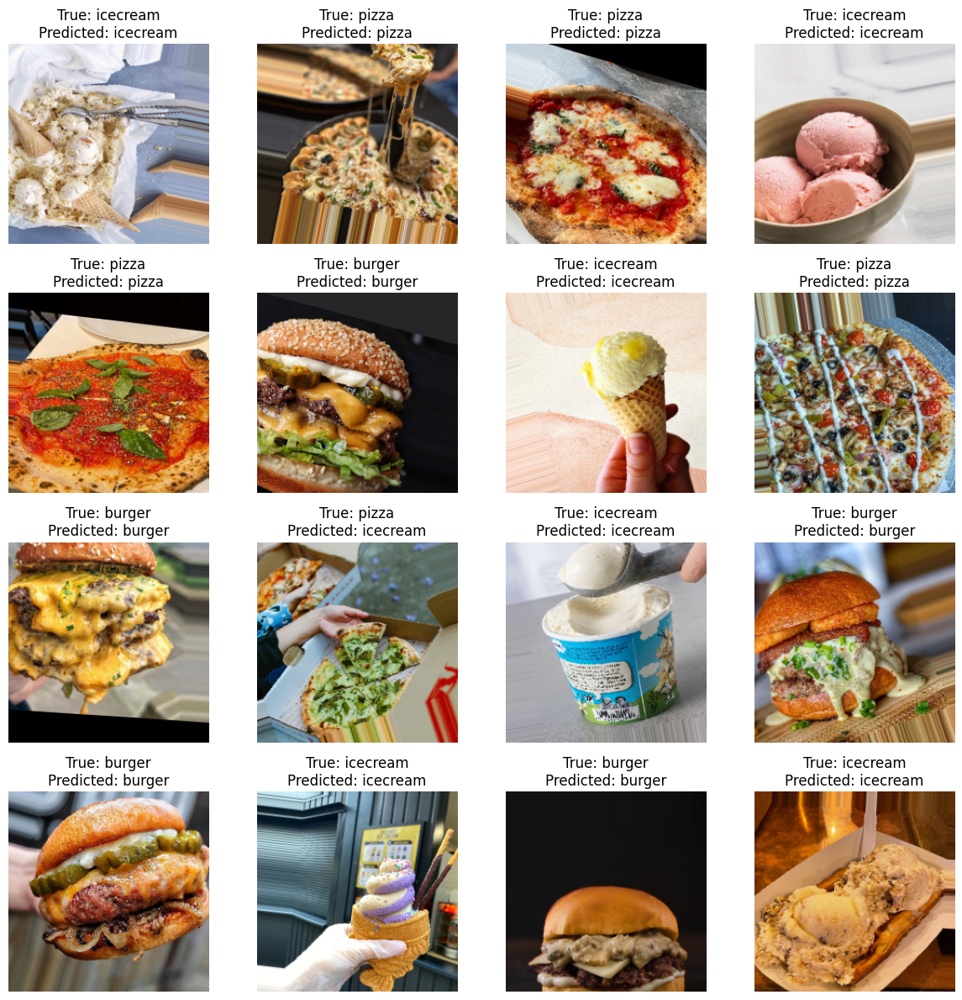

In [24]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Plot training and validation loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

# Generate sample predictions
sample_images, sample_labels = next(validation_generator)
sample_predictions = model.predict(sample_images)

# Convert one-hot encoded labels back to class names
class_names = list(train_generator.class_indices.keys())
sample_labels = np.argmax(sample_labels, axis=1)
sample_predictions = np.argmax(sample_predictions, axis=1)

# Display sample images with their true and predicted labels
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(sample_images[i])
    ax.set_title(f'True: {class_names[sample_labels[i]]}\nPredicted: {class_names[sample_predictions[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

---


